In [1]:
from datasets import load_dataset

dataset = load_dataset(path='lansinuote/diffusion.8.instruct_pix2pix',
                       split='train')

dataset, dataset[0]

Using custom data configuration lansinuote--diffusion.8.instruct_pix2pix-5db27ce94b1e4a9e
Found cached dataset parquet (/root/.cache/huggingface/datasets/lansinuote___parquet/lansinuote--diffusion.8.instruct_pix2pix-5db27ce94b1e4a9e/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec)


(Dataset({
     features: ['input', 'text', 'output'],
     num_rows: 1000
 }),
 {'input': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=512x512>,
  'text': 'Turn it into a photo',
  'output': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=512x512>})

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_instruct_pix2pix.StableDiffusionInstructPix2PixPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/250 [00:00<?, ?it/s]

0 Turn it into a photo


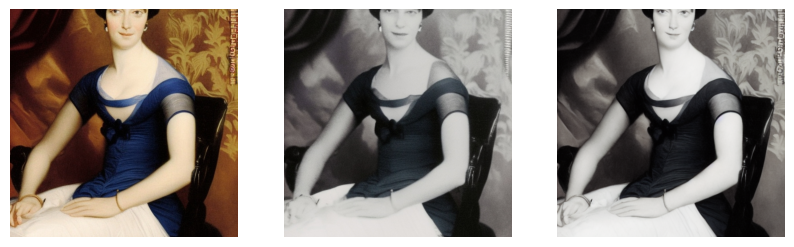

  0%|          | 0/250 [00:00<?, ?it/s]

14 The siblings are all robots


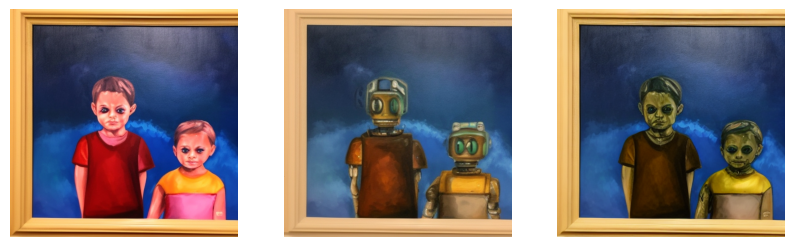

  0%|          | 0/250 [00:00<?, ?it/s]

16 turn the background into a beach


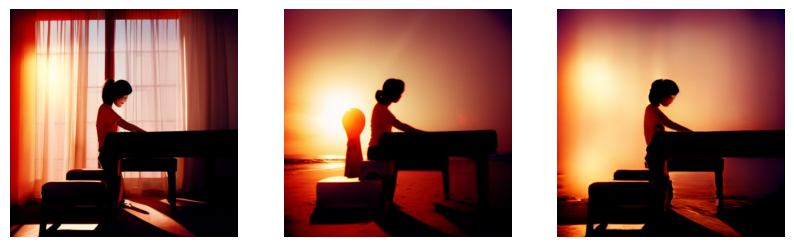

  0%|          | 0/250 [00:00<?, ?it/s]

23 make it in Japan


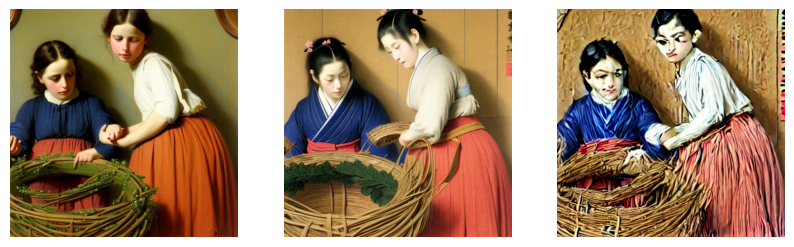

  0%|          | 0/250 [00:00<?, ?it/s]

43 change the subject to a horse


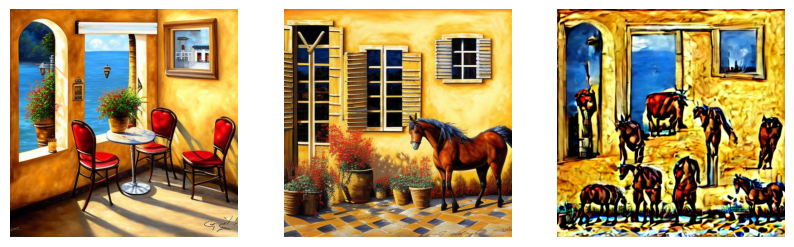

  0%|          | 0/250 [00:00<?, ?it/s]

63 Make her a farmer


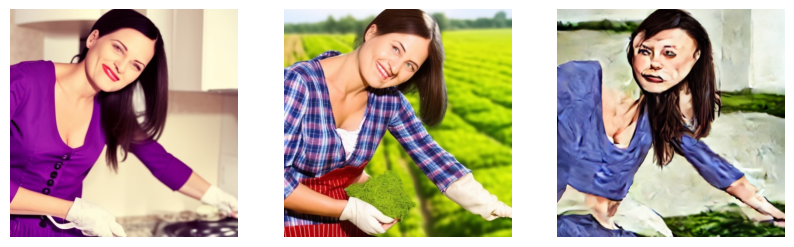

  0%|          | 0/250 [00:00<?, ?it/s]

65 Make the paintings of buildings


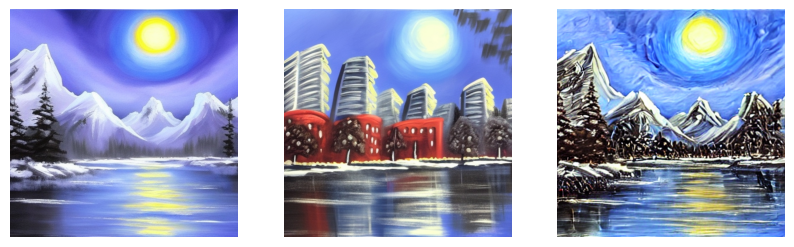

  0%|          | 0/250 [00:00<?, ?it/s]

66 add a cat


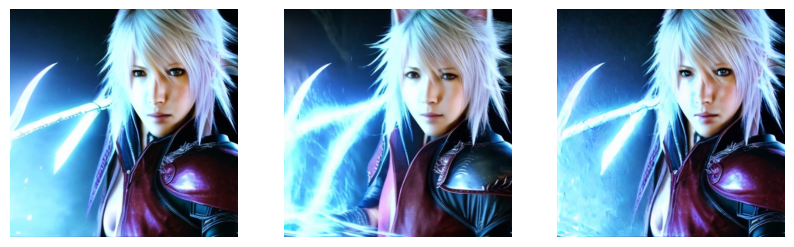

  0%|          | 0/250 [00:00<?, ?it/s]

72 make it more modern


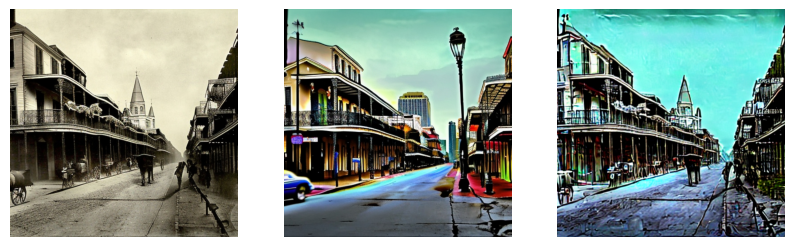

  0%|          | 0/250 [00:00<?, ?it/s]

78 make the picture black and white


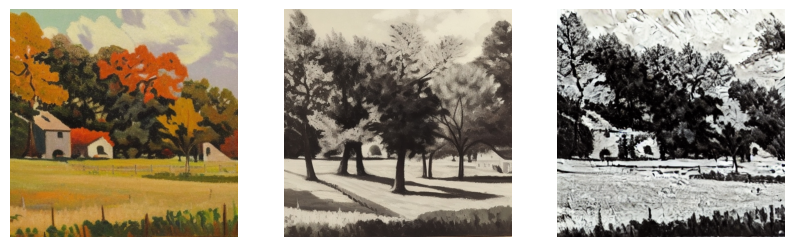

  0%|          | 0/250 [00:00<?, ?it/s]

79 Turn the Rocky Mountains into The Himalayas


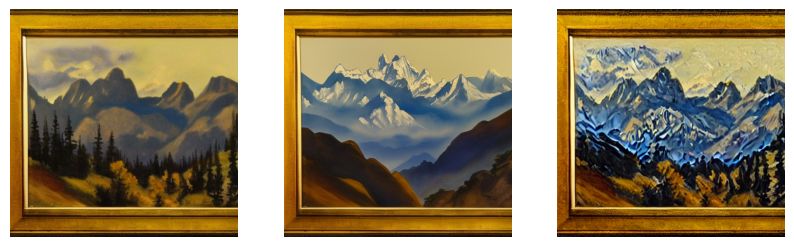

  0%|          | 0/250 [00:00<?, ?it/s]

80 It is now a painting


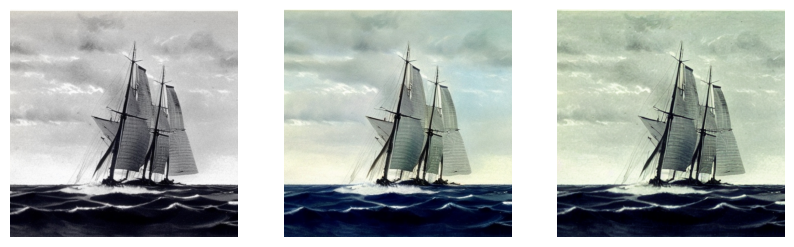

  0%|          | 0/250 [00:00<?, ?it/s]

82 have the lady wear a red dress with roses.


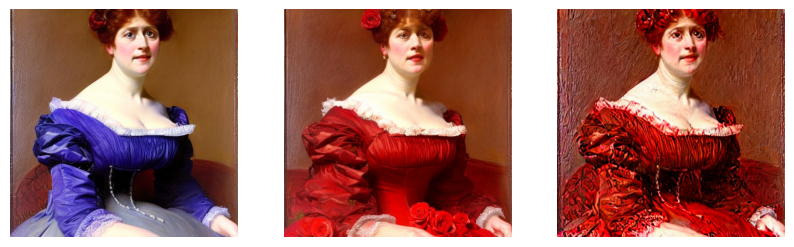

  0%|          | 0/250 [00:00<?, ?it/s]

91 Make it an illustration for a children's book.


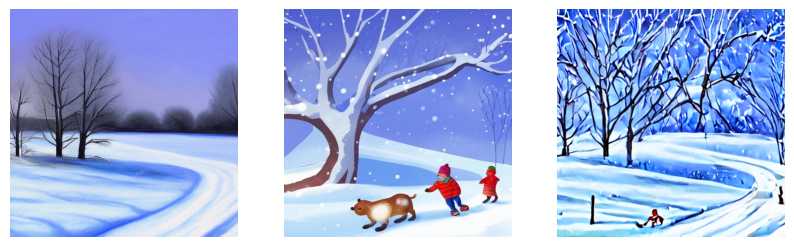

  0%|          | 0/250 [00:00<?, ?it/s]

101 as if it were a diorama


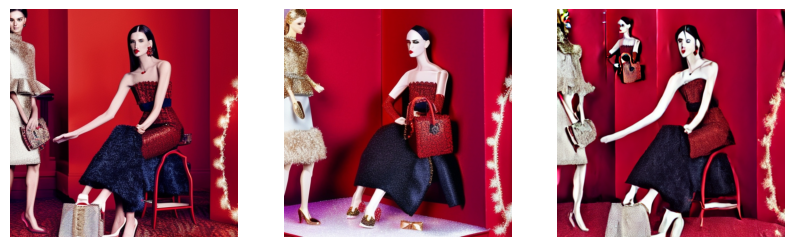

  0%|          | 0/250 [00:00<?, ?it/s]

115 have the two animals be a lion and a lioness


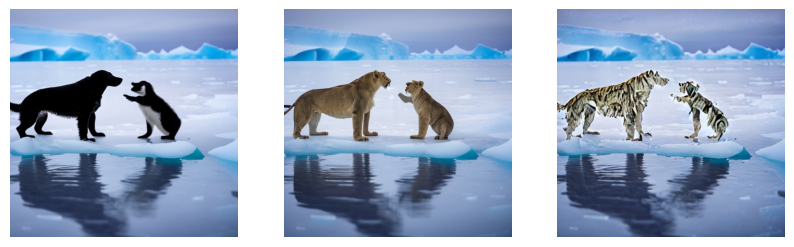

  0%|          | 0/250 [00:00<?, ?it/s]

121 make it a painting of a dragon


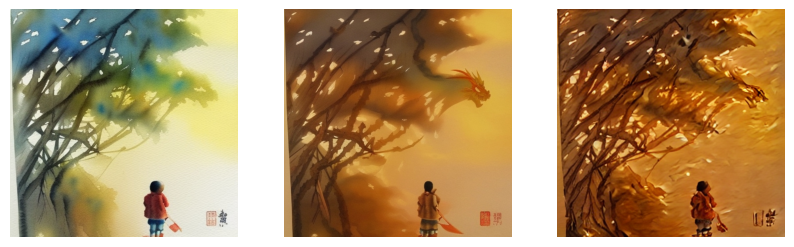

  0%|          | 0/250 [00:00<?, ?it/s]

133 make the abigail a dog


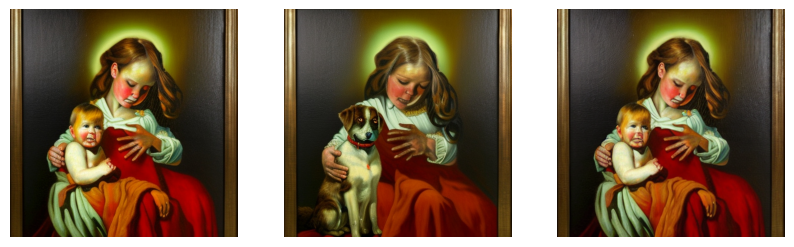

  0%|          | 0/250 [00:00<?, ?it/s]

135 add a blue background


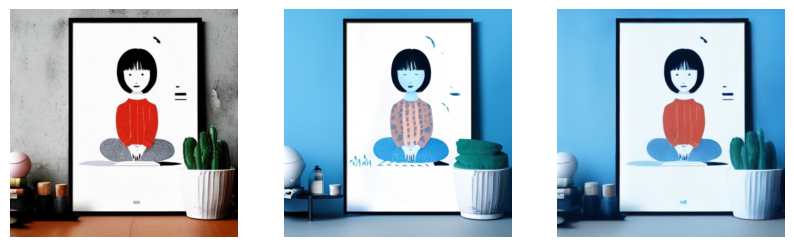

  0%|          | 0/250 [00:00<?, ?it/s]

136 make it a pencil drawing


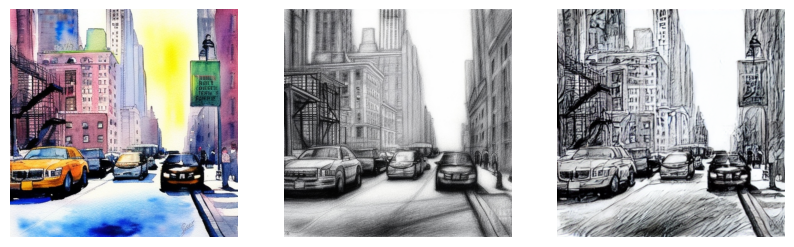

  0%|          | 0/250 [00:00<?, ?it/s]

142 have her wear a cape


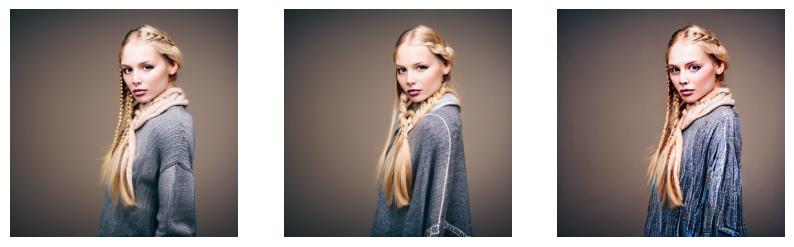

  0%|          | 0/250 [00:00<?, ?it/s]

143 make the straw hat purple


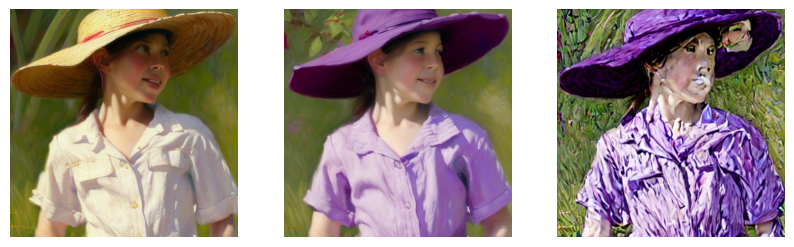

  0%|          | 0/250 [00:00<?, ?it/s]

145 make it a coffee shop


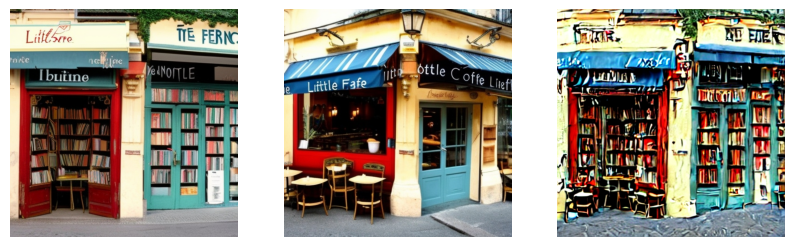

  0%|          | 0/250 [00:00<?, ?it/s]

148 change the bathers to marathon runners


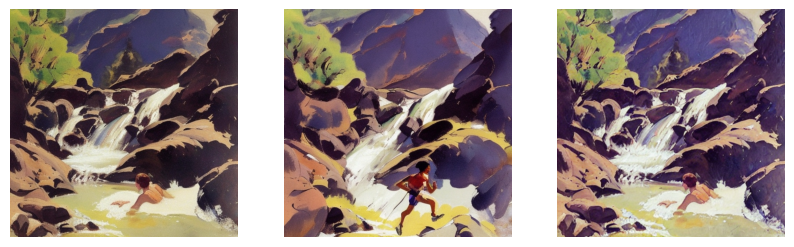

  0%|          | 0/250 [00:00<?, ?it/s]

156 The church is a mosque


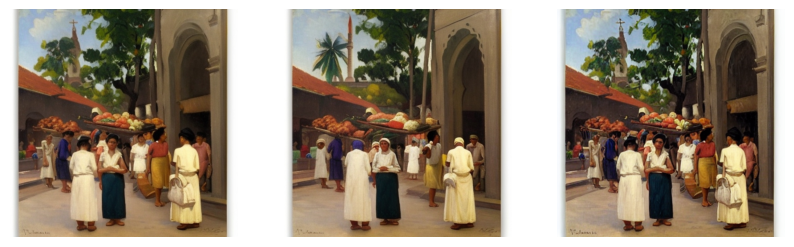

  0%|          | 0/250 [00:00<?, ?it/s]

169 Add a carrot


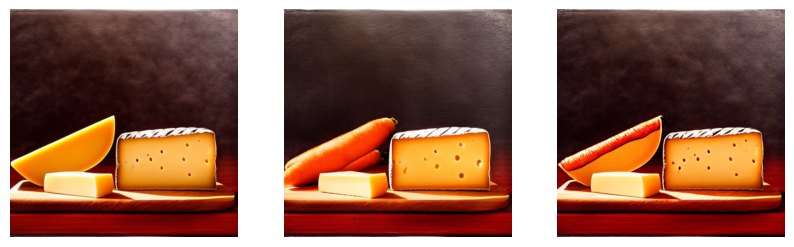

  0%|          | 0/250 [00:00<?, ?it/s]

171 make it blurry


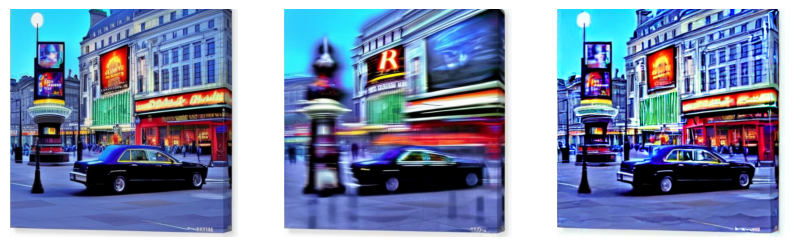

  0%|          | 0/250 [00:00<?, ?it/s]

175 make him into a cyborg


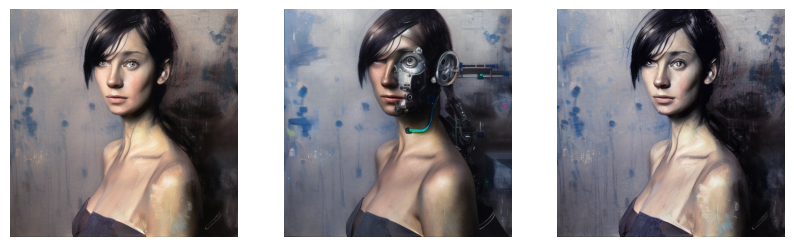

  0%|          | 0/250 [00:00<?, ?it/s]

176 make it a desert


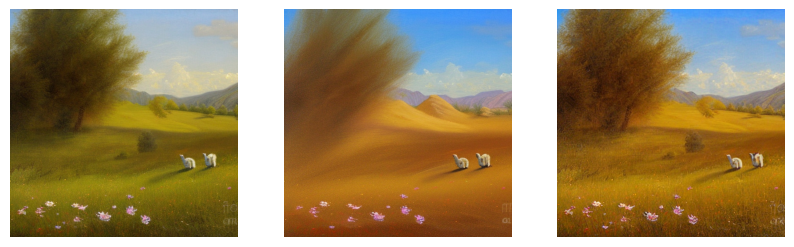

In [2]:
from diffusers import StableDiffusionInstructPix2PixPipeline
from matplotlib import pyplot as plt
%matplotlib inline
import torch


def test(pipeline):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    pipeline = pipeline.to(device)

    for i in [
            0, 14, 16, 23, 43, 63, 65, 66, 72, 78, 79, 80, 82, 91, 101, 115,
            121, 133, 135, 136, 142, 143, 145, 148, 156, 169, 171, 175, 176
    ]:
        input = dataset[i]['input']
        text = dataset[i]['text']
        output = dataset[i]['output']

        pred = pipeline(
            text,
            image=input,
            #优化步数
            num_inference_steps=250,
            #原图相关系数
            image_guidance_scale=1.5,
            #文本相关系数
            guidance_scale=10).images[0]

        print(i, text)

        plt.figure(figsize=(10, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(input)
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(output)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(pred)
        plt.axis('off')
        plt.show()


pipeline = StableDiffusionInstructPix2PixPipeline.from_pretrained(
    'lansinuote/diffusion.8.instruct_pix2pix', safety_checker=None)

test(pipeline)